<a href="https://colab.research.google.com/github/Team-76-CPEN-491/diarization/blob/main/NemoDiarizationAndTranscript.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
"""
You can run either this notebook locally (if you have all the dependencies and a GPU) or on Google Colab.

Instructions for setting up Colab are as follows:
1. Open a new Python 3 notebook.
2. Import this notebook from GitHub (File -> Upload Notebook -> "GITHUB" tab -> copy/paste GitHub URL)
3. Connect to an instance with a GPU (Runtime -> Change runtime type -> select "GPU" for hardware accelerator)
4. Run this cell to set up dependencies.
"""
# If you're using Google Colab and not running locally, run this cell.

## Install dependencies
!pip install wget
!apt-get install sox libsndfile1 ffmpeg
!pip install text-unidecode

# ## Install NeMo
BRANCH = 'main'
!python -m pip install git+https://github.com/NVIDIA/NeMo.git@$BRANCH#egg=nemo_toolkit[asr]

## Install TorchAudio
!pip install torchaudio -f https://download.pytorch.org/whl/torch_stable.html

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=442171b63c681725692839f85b8085c53c312ab0ac65ef809bf6f08e526bbf71
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libsndfile1 is already the newest version (1.0.31-2ubuntu0.1).
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
The following additional packages will be installed:
  libopencore-amrnb0 libopencore-amrwb0 libsox-fmt-alsa libsox-fmt-base libsox3 libwavpack1
Suggested packages:
  libsox-fmt-all
The following NEW packages will be installed:
  libopencore-amrnb0 libopencore-amrwb0 libsox-fmt-alsa libsox-fmt-base libsox3 libwavpack1 sox
0 upgraded, 7 newly installed, 0 to remove and 49 not upgraded.
Need to get 617 kB of archives.
After this operation, 1,764 kB of additi

In [ ]:
import nemo.collections.asr as nemo_asr
import numpy as np
from IPython.display import Audio, display
import librosa
import os
import wget
import matplotlib.pyplot as plt

import nemo
import glob

ROOT = os.getcwd()
data_dir = os.path.join(ROOT,'data')
os.makedirs(data_dir, exist_ok=True)
audio_filename = 'call_108.wav'
audio = os.path.join(data_dir, audio_filename)


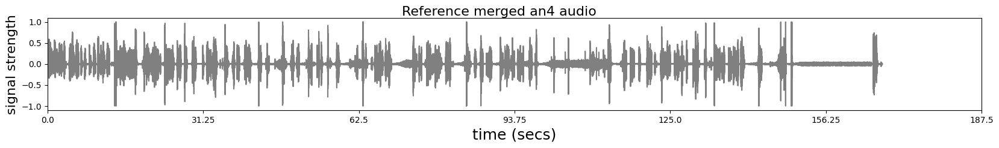

In [ ]:

sr = 16000
signal, sr = librosa.load(audio,sr=sr)

fig,ax = plt.subplots(1,1)
fig.set_figwidth(20)
fig.set_figheight(2)
plt.plot(np.arange(len(signal)),signal,'gray')
fig.suptitle('Reference merged an4 audio', fontsize=16)
plt.xlabel('time (secs)', fontsize=18)
ax.margins(x=0)
plt.ylabel('signal strength', fontsize=16);
a,_ = plt.xticks();plt.xticks(a,a/sr);

Audio(audio)

In [ ]:
from nemo.collections.asr.parts.utils.speaker_utils import rttm_to_labels, labels_to_pyannote_object

In [ ]:
# Create a manifest for input with below format.
# {'audio_filepath': /path/to/audio_file, 'offset': 0, 'duration':None, 'label': 'infer', 'text': '-',
# 'num_speakers': None, 'rttm_filepath': /path/to/rttm/file, 'uem_filepath'='/path/to/uem/filepath'}
import json
meta = {
    'audio_filepath': audio,
    'offset': 0,
    'duration':None,
    'label': 'infer',
    'text': '-',
    'num_speakers': None,
    'rttm_filepath': None,
    'uem_filepath': None
}
with open('data/input_manifest.json','w') as fp:
    json.dump(meta,fp)
    fp.write('\n')

!cat data/input_manifest.json

output_dir = os.path.join(ROOT, 'system_vad')
os.makedirs(output_dir,exist_ok=True)

{"audio_filepath": "/content/data/call_108.wav", "offset": 0, "duration": null, "label": "infer", "text": "-", "num_speakers": null, "rttm_filepath": null, "uem_filepath": null}


In [ ]:
from omegaconf import OmegaConf
MODEL_CONFIG = os.path.join(data_dir,'diar_infer_telephonic.yaml')
if not os.path.exists(MODEL_CONFIG):
    config_url = "https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/speaker_tasks/diarization/conf/inference/diar_infer_telephonic.yaml"
    MODEL_CONFIG = wget.download(config_url,data_dir)

config = OmegaConf.load(MODEL_CONFIG)
print(OmegaConf.to_yaml(config))

name: ClusterDiarizer
num_workers: 1
sample_rate: 16000
batch_size: 64
device: null
verbose: true
diarizer:
  manifest_filepath: ???
  out_dir: ???
  oracle_vad: false
  collar: 0.25
  ignore_overlap: true
  vad:
    model_path: vad_multilingual_marblenet
    external_vad_manifest: null
    parameters:
      window_length_in_sec: 0.15
      shift_length_in_sec: 0.01
      smoothing: median
      overlap: 0.5
      onset: 0.1
      offset: 0.1
      pad_onset: 0.1
      pad_offset: 0
      min_duration_on: 0
      min_duration_off: 0.2
      filter_speech_first: true
  speaker_embeddings:
    model_path: titanet_large
    parameters:
      window_length_in_sec:
      - 1.5
      - 1.25
      - 1.0
      - 0.75
      - 0.5
      shift_length_in_sec:
      - 0.75
      - 0.625
      - 0.5
      - 0.375
      - 0.25
      multiscale_weights:
      - 1
      - 1
      - 1
      - 1
      - 1
      save_embeddings: true
  clustering:
    parameters:
      oracle_num_speakers: false
      max

In [ ]:
pretrained_vad = 'vad_multilingual_marblenet'
pretrained_speaker_model = 'titanet_large'

In [ ]:

config.diarizer.manifest_filepath = 'data/input_manifest.json'
config.diarizer.out_dir = output_dir # Directory to store intermediate files and prediction outputs
config.diarizer.speaker_embeddings.model_path = pretrained_speaker_model
config.diarizer.oracle_vad = False # ----> SYSTEM VAD
config.diarizer.clustering.parameters.oracle_num_speakers = False

# Here, we use our in-house pretrained NeMo VAD model
config.diarizer.vad.model_path = pretrained_vad
config.diarizer.asr.model_path = 'stt_en_conformer_ctc_large'
config.diarizer.asr.parameters.asr_based_vad = False


In [ ]:
from nemo.collections.asr.parts.utils.decoder_timestamps_utils import ASRDecoderTimeStamps
asr_decoder_ts = ASRDecoderTimeStamps(config.diarizer)
asr_model = asr_decoder_ts.set_asr_model()
word_hyp, word_ts_hyp = asr_decoder_ts.run_ASR(asr_model)

print("Decoded word output dictionary: \n", word_hyp['call_108'])
print("Word-level timestamps dictionary: \n", word_ts_hyp['call_108'])

[NeMo I 2024-10-25 17:34:36 speaker_utils:93] Number of files to diarize: 1
[NeMo I 2024-10-25 17:34:36 cloud:58] Found existing object /root/.cache/torch/NeMo/NeMo_2.1.0rc0/stt_en_conformer_ctc_large/afb212c5bcf904e326b5e5751e7c7465/stt_en_conformer_ctc_large.nemo.
[NeMo I 2024-10-25 17:34:36 cloud:64] Re-using file from: /root/.cache/torch/NeMo/NeMo_2.1.0rc0/stt_en_conformer_ctc_large/afb212c5bcf904e326b5e5751e7c7465/stt_en_conformer_ctc_large.nemo
[NeMo I 2024-10-25 17:34:36 common:826] Instantiating model from pre-trained checkpoint
[NeMo I 2024-10-25 17:34:38 mixins:176] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2024-10-25 17:34:38 modelPT:176] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath:
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket1/tarred_audio_manifest.json
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket2/tarred_audio_manifest.json
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket3/tarred_audio_manifest.json
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket4/tarred_audio_manifest.json
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket5/tarred_audio_manifest.json
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket6/tarred_audio_manifest.json
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket7/tarred_audio_manifest.json
    - - /data2/nemo_asr/nemo_asr_set_3.0/bucket8/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 1
    shuffle: true
    num_workers: 4
    pin_memory: true
    use_start_end_token: false
    trim_

[NeMo I 2024-10-25 17:34:38 features:305] PADDING: 0
[NeMo I 2024-10-25 17:34:40 save_restore_connector:275] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_2.1.0rc0/stt_en_conformer_ctc_large/afb212c5bcf904e326b5e5751e7c7465/stt_en_conformer_ctc_large.nemo.


[NeMo W 2024-10-25 17:34:40 decoder_timestamps_utils:71] `ctc_decode` was set to True. Note that this is ignored.


[NeMo I 2024-10-25 17:34:40 features:305] PADDING: 0
[NeMo I 2024-10-25 17:34:40 features:305] PADDING: 0
[NeMo I 2024-10-25 17:34:40 decoder_timestamps_utils:675] Running ASR model stt_en_conformer_ctc_large
[NeMo I 2024-10-25 17:34:40 decoder_timestamps_utils:679] [1/1] FrameBatchASR: /content/data/call_108.wav
Decoded word output dictionary: 
 ['conversation', 'recorded', 'on', 'january', 'first', 'two', 'thousand', 'and', 'eleven', 'at', 'ten', 'fifty', 'seven', 'on', 'channel', 'twenty', 'nine', 'nine', 'one', 'one', 'operator', 'thirteen', 'forty', 'three', 'where', 'is', 'your', 'emergency', 'i', 'here', 'at', 'the', 'po', "i'm", 'here', 'at', 'the', 'police', 'station', 'al', 'falls', 'ok', 'yah', "what's", 'wrong', 'i', 'told', 'my', 'sister', "i'm", 'turn', 'yself', 'in', 'where', 'did', 'it', 'happen', 'a', 'house', 'where', 'do', 'you', 'live', 'at', 'tw', 'forty', 'seven', 'rofall', 'avenue', 'how', 'did', 'you', 'kill', 'her', 'i', 'strangled', 'her', 'what', 'apartment',

In [ ]:
from nemo.collections.asr.parts.utils.diarization_utils import OfflineDiarWithASR
asr_diar_offline = OfflineDiarWithASR(config.diarizer)
asr_diar_offline.word_ts_anchor_offset = asr_decoder_ts.word_ts_anchor_offset

[NeMo I 2024-10-25 17:34:49 speaker_utils:93] Number of files to diarize: 1


In [ ]:
diar_hyp, diar_score = asr_diar_offline.run_diarization(config, word_ts_hyp)
print("Diarization hypothesis output: \n", diar_hyp['call_108'])


[NeMo I 2024-10-25 17:35:25 clustering_diarizer:118] Loading pretrained vad_multilingual_marblenet model from NGC
[NeMo I 2024-10-25 17:35:25 cloud:58] Found existing object /root/.cache/torch/NeMo/NeMo_2.1.0rc0/vad_multilingual_marblenet/670f425c7f186060b7a7268ba6dfacb2/vad_multilingual_marblenet.nemo.
[NeMo I 2024-10-25 17:35:25 cloud:64] Re-using file from: /root/.cache/torch/NeMo/NeMo_2.1.0rc0/vad_multilingual_marblenet/670f425c7f186060b7a7268ba6dfacb2/vad_multilingual_marblenet.nemo
[NeMo I 2024-10-25 17:35:25 common:826] Instantiating model from pre-trained checkpoint


[NeMo W 2024-10-25 17:35:25 modelPT:176] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /manifests/ami_train_0.63.json,/manifests/freesound_background_train.json,/manifests/freesound_laughter_train.json,/manifests/fisher_2004_background.json,/manifests/fisher_2004_speech_sampled.json,/manifests/google_train_manifest.json,/manifests/icsi_all_0.63.json,/manifests/musan_freesound_train.json,/manifests/musan_music_train.json,/manifests/musan_soundbible_train.json,/manifests/mandarin_train_sample.json,/manifests/german_train_sample.json,/manifests/spanish_train_sample.json,/manifests/french_train_sample.json,/manifests/russian_train_sample.json
    sample_rate: 16000
    labels:
    - background
    - speech
    batch_size: 256
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: sca

[NeMo I 2024-10-25 17:35:25 features:305] PADDING: 16
[NeMo I 2024-10-25 17:35:25 save_restore_connector:275] Model EncDecClassificationModel was successfully restored from /root/.cache/torch/NeMo/NeMo_2.1.0rc0/vad_multilingual_marblenet/670f425c7f186060b7a7268ba6dfacb2/vad_multilingual_marblenet.nemo.
[NeMo I 2024-10-25 17:35:25 clustering_diarizer:151] Loading pretrained titanet_large model from NGC
[NeMo I 2024-10-25 17:35:25 cloud:58] Found existing object /root/.cache/torch/NeMo/NeMo_2.1.0rc0/titanet-l/11ba0924fdf87c049e339adbf6899d48/titanet-l.nemo.
[NeMo I 2024-10-25 17:35:25 cloud:64] Re-using file from: /root/.cache/torch/NeMo/NeMo_2.1.0rc0/titanet-l/11ba0924fdf87c049e339adbf6899d48/titanet-l.nemo
[NeMo I 2024-10-25 17:35:25 common:826] Instantiating model from pre-trained checkpoint


[NeMo W 2024-10-25 17:35:26 modelPT:176] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /manifests/combined_fisher_swbd_voxceleb12_librispeech/train.json
    sample_rate: 16000
    labels: null
    batch_size: 64
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    augmentor:
      noise:
        manifest_path: /manifests/noise/rir_noise_manifest.json
        prob: 0.5
        min_snr_db: 0
        max_snr_db: 15
      speed:
        prob: 0.5
        sr: 16000
        resample_type: kaiser_fast
        min_speed_rate: 0.95
        max_speed_rate: 1.05
    num_workers: 15
    pin_memory: true
    
[NeMo W 2024-10-25 17:35:26 modelPT:183] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method 

[NeMo I 2024-10-25 17:35:26 features:305] PADDING: 16
[NeMo I 2024-10-25 17:35:26 save_restore_connector:275] Model EncDecSpeakerLabelModel was successfully restored from /root/.cache/torch/NeMo/NeMo_2.1.0rc0/titanet-l/11ba0924fdf87c049e339adbf6899d48/titanet-l.nemo.


[NeMo W 2024-10-25 17:35:26 clustering_diarizer:399] Deleting previous clustering diarizer outputs.


[NeMo I 2024-10-25 17:35:26 speaker_utils:93] Number of files to diarize: 1
[NeMo I 2024-10-25 17:35:26 clustering_diarizer:304] Split long audio file to avoid CUDA memory issue


splitting manifest: 100%|██████████| 1/1 [00:00<00:00, 38.39it/s]

[NeMo I 2024-10-25 17:35:26 vad_utils:97] The prepared manifest file exists. Overwriting!
[NeMo I 2024-10-25 17:35:26 classification_models:293] Perform streaming frame-level VAD
[NeMo I 2024-10-25 17:35:26 collections:742] Filtered duration for loading collection is  0.00 hours.
[NeMo I 2024-10-25 17:35:26 collections:743] Dataset successfully loaded with 4 items and total duration provided from manifest is  0.05 hours.
[NeMo I 2024-10-25 17:35:26 collections:748] # 4 files loaded accounting to # 1 labels



vad: 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

[NeMo I 2024-10-25 17:35:28 clustering_diarizer:245] Generating predictions with overlapping input segments


[NeMo I 2024-10-25 17:35:30 clustering_diarizer:257] Converting frame level prediction to speech/no-speech segment in start and end times format.


creating speech segments: 100%|██████████| 1/1 [00:00<00:00,  6.79it/s]

[NeMo I 2024-10-25 17:35:31 clustering_diarizer:282] Subsegmentation for embedding extraction: scale0, /content/system_vad/speaker_outputs/subsegments_scale0.json
[NeMo I 2024-10-25 17:35:31 clustering_diarizer:338] Extracting embeddings for Diarization
[NeMo I 2024-10-25 17:35:31 collections:742] Filtered duration for loading collection is  0.00 hours.
[NeMo I 2024-10-25 17:35:31 collections:743] Dataset successfully loaded with 93 items and total duration provided from manifest is  0.02 hours.
[NeMo I 2024-10-25 17:35:31 collections:748] # 93 files loaded accounting to # 1 labels



[1/5] extract embeddings: 100%|██████████| 2/2 [00:00<00:00,  6.23it/s]

[NeMo I 2024-10-25 17:35:31 clustering_diarizer:384] Saved embedding files to /content/system_vad/speaker_outputs/embeddings
[NeMo I 2024-10-25 17:35:31 clustering_diarizer:282] Subsegmentation for embedding extraction: scale1, /content/system_vad/speaker_outputs/subsegments_scale1.json
[NeMo I 2024-10-25 17:35:31 clustering_diarizer:338] Extracting embeddings for Diarization
[NeMo I 2024-10-25 17:35:31 collections:742] Filtered duration for loading collection is  0.00 hours.
[NeMo I 2024-10-25 17:35:31 collections:743] Dataset successfully loaded with 103 items and total duration provided from manifest is  0.03 hours.
[NeMo I 2024-10-25 17:35:31 collections:748] # 103 files loaded accounting to # 1 labels



[2/5] extract embeddings: 100%|██████████| 2/2 [00:00<00:00,  7.25it/s]

[NeMo I 2024-10-25 17:35:31 clustering_diarizer:384] Saved embedding files to /content/system_vad/speaker_outputs/embeddings
[NeMo I 2024-10-25 17:35:31 clustering_diarizer:282] Subsegmentation for embedding extraction: scale2, /content/system_vad/speaker_outputs/subsegments_scale2.json
[NeMo I 2024-10-25 17:35:31 clustering_diarizer:338] Extracting embeddings for Diarization
[NeMo I 2024-10-25 17:35:31 collections:742] Filtered duration for loading collection is  0.00 hours.
[NeMo I 2024-10-25 17:35:31 collections:743] Dataset successfully loaded with 125 items and total duration provided from manifest is  0.03 hours.
[NeMo I 2024-10-25 17:35:31 collections:748] # 125 files loaded accounting to # 1 labels



[3/5] extract embeddings: 100%|██████████| 2/2 [00:00<00:00,  7.30it/s]

[NeMo I 2024-10-25 17:35:32 clustering_diarizer:384] Saved embedding files to /content/system_vad/speaker_outputs/embeddings
[NeMo I 2024-10-25 17:35:32 clustering_diarizer:282] Subsegmentation for embedding extraction: scale3, /content/system_vad/speaker_outputs/subsegments_scale3.json
[NeMo I 2024-10-25 17:35:32 clustering_diarizer:338] Extracting embeddings for Diarization
[NeMo I 2024-10-25 17:35:32 collections:742] Filtered duration for loading collection is  0.00 hours.
[NeMo I 2024-10-25 17:35:32 collections:743] Dataset successfully loaded with 164 items and total duration provided from manifest is  0.03 hours.
[NeMo I 2024-10-25 17:35:32 collections:748] # 164 files loaded accounting to # 1 labels



[4/5] extract embeddings: 100%|██████████| 3/3 [00:00<00:00, 11.34it/s]

[NeMo I 2024-10-25 17:35:32 clustering_diarizer:384] Saved embedding files to /content/system_vad/speaker_outputs/embeddings
[NeMo I 2024-10-25 17:35:32 clustering_diarizer:282] Subsegmentation for embedding extraction: scale4, /content/system_vad/speaker_outputs/subsegments_scale4.json
[NeMo I 2024-10-25 17:35:32 clustering_diarizer:338] Extracting embeddings for Diarization
[NeMo I 2024-10-25 17:35:32 collections:742] Filtered duration for loading collection is  0.00 hours.
[NeMo I 2024-10-25 17:35:32 collections:743] Dataset successfully loaded with 256 items and total duration provided from manifest is  0.03 hours.
[NeMo I 2024-10-25 17:35:32 collections:748] # 256 files loaded accounting to # 1 labels



[5/5] extract embeddings: 100%|██████████| 4/4 [00:00<00:00, 13.71it/s]

[NeMo I 2024-10-25 17:35:32 clustering_diarizer:384] Saved embedding files to /content/system_vad/speaker_outputs/embeddings



clustering: 100%|██████████| 1/1 [00:00<00:00,  4.28it/s]

[NeMo I 2024-10-25 17:35:32 clustering_diarizer:452] Outputs are saved in /content/system_vad directory



[NeMo W 2024-10-25 17:35:32 der:185] Check if each ground truth RTTMs were present in the provided manifest file. Skipping calculation of Diariazation Error Rate


Diarization hypothesis output: 
 ['0.14 2.0100000000000002 speaker_2', '2.22 3.6900000000000004 speaker_2', '4.22 7.05 speaker_2', '7.26 7.93 speaker_2', '8.22 8.97 speaker_2', '9.18 9.77 speaker_2', '9.98 12.65 speaker_2', '14.3 15.370000000000001 speaker_1', '17.58 18.169999999999998 speaker_1', '19.26 19.53 speaker_0', '19.74 21.77 speaker_0', '22.54 22.89 speaker_1', '23.66 24.49 speaker_1', '24.78 25.61 speaker_1', '25.9 26.81 speaker_1', '27.42 27.85 speaker_0', '28.94 30.01 speaker_1', '31.02 31.53 speaker_1', '32.14 34.25 speaker_1', '35.82 36.49 speaker_0', '36.94 37.69 speaker_1', '37.9 38.809999999999995 speaker_0', '39.5 41.13 speaker_1', '42.22 43.21 speaker_0', '44.38 44.650000000000006 speaker_1', '47.1 47.370000000000005 speaker_0', '47.58 48.17 speaker_0', '49.02 49.690000000000005 speaker_1', '49.9 50.57 speaker_1', '52.3 53.129999999999995 speaker_0', '53.98 54.489999999999995 speaker_1', '55.1 55.45 speaker_1', '56.14 57.21 speaker_0', '57.98 58.73 speaker_1', '63.2

In [ ]:
def display_waveform(signal,text='Audio',overlay_color=[]):
    fig,ax = plt.subplots(1,1)
    fig.set_figwidth(20)
    fig.set_figheight(2)
    plt.scatter(np.arange(len(signal)),signal,s=1,marker='o',c='k')
    if len(overlay_color):
        plt.scatter(np.arange(len(signal)),signal,s=1,marker='o',c=overlay_color)
    fig.suptitle(text, fontsize=16)
    plt.xlabel('time (secs)', fontsize=18)
    plt.ylabel('signal strength', fontsize=14);
    plt.axis([0,len(signal),-0.5,+0.5])
    time_axis,_ = plt.xticks();
    plt.xticks(time_axis[:-1],time_axis[:-1]/sample_rate);

COLORS="b g c m y".split()

def get_color(signal,speech_labels,sample_rate=16000):
    c=np.array(['k']*len(signal))
    for time_stamp in speech_labels:
        start,end,label=time_stamp.split()
        start,end = int(float(start)*16000),int(float(end)*16000),
        if label == "speech":
            code = 'red'
        else:
            code = COLORS[int(label.split('_')[-1])]
        c[start:end]=code

    return c

In [ ]:
def read_file(path_to_file):
    with open(path_to_file) as f:
        contents = f.read().splitlines()
    return contents

predicted_speaker_label_rttm_path = f"system_vad/pred_rttms/call_108.rttm"
pred_rttm = read_file(predicted_speaker_label_rttm_path)

import pprint
pp = pprint.PrettyPrinter(indent=4)

pp.pprint(pred_rttm)

from nemo.collections.asr.parts.utils.speaker_utils import rttm_to_labels
pred_labels = rttm_to_labels(predicted_speaker_label_rttm_path)

color = get_color(signal, pred_labels)
#display_waveform(signal,'Audio with Speaker Labels', color)
display(Audio(signal,rate=16000))

[   'SPEAKER call_108 1   0.140   1.870 <NA> <NA> speaker_2 <NA> <NA>',
    'SPEAKER call_108 1   2.220   1.470 <NA> <NA> speaker_2 <NA> <NA>',
    'SPEAKER call_108 1   4.220   2.830 <NA> <NA> speaker_2 <NA> <NA>',
    'SPEAKER call_108 1   7.260   0.670 <NA> <NA> speaker_2 <NA> <NA>',
    'SPEAKER call_108 1   8.220   0.750 <NA> <NA> speaker_2 <NA> <NA>',
    'SPEAKER call_108 1   9.180   0.590 <NA> <NA> speaker_2 <NA> <NA>',
    'SPEAKER call_108 1   9.980   2.670 <NA> <NA> speaker_2 <NA> <NA>',
    'SPEAKER call_108 1   14.300   1.070 <NA> <NA> speaker_1 <NA> <NA>',
    'SPEAKER call_108 1   17.580   0.590 <NA> <NA> speaker_1 <NA> <NA>',
    'SPEAKER call_108 1   19.260   0.270 <NA> <NA> speaker_0 <NA> <NA>',
    'SPEAKER call_108 1   19.740   2.030 <NA> <NA> speaker_0 <NA> <NA>',
    'SPEAKER call_108 1   22.540   0.350 <NA> <NA> speaker_1 <NA> <NA>',
    'SPEAKER call_108 1   23.660   0.830 <NA> <NA> speaker_1 <NA> <NA>',
    'SPEAKER call_108 1   24.780   0.830 <NA> <NA> speaker

In [ ]:
trans_info_dict = asr_diar_offline.get_transcript_with_speaker_labels(diar_hyp, word_hyp, word_ts_hyp)


[NeMo I 2024-10-25 17:39:59 diarization_utils:876] Creating results for Session: call_108 n_spk: 3 
[NeMo I 2024-10-25 17:40:00 diarization_utils:749] Diarization with ASR output files are saved in: /content/system_vad/pred_rttms


In [ ]:
transcription_path_to_file = f"system_vad/pred_rttms/call_108.txt"
transcript = read_file(transcription_path_to_file)
pp.pprint(transcript)

[   '[00:00.14 - 00:12.20] speaker_2: conversation recorded on january first '
    'two thousand and eleven at ten fifty seven on channel twenty nine',
    '[00:19.20 - 00:19.68] speaker_1: nine one',
    '[00:19.76 - 00:21.80] speaker_0: one operator thirteen forty three where',
    "[00:21.84 - 00:26.84] speaker_1: is your emergency i here at the po i'm "
    'here at the police station al falls',
    '[00:27.48 - 00:27.68] speaker_0: ok',
    "[00:28.92 - 00:33.96] speaker_1: yah what's wrong i told my sister i'm "
    'turn yself in',
    '[00:35.40 - 00:36.36] speaker_0: where did it happen a',
    '[00:37.32 - 00:37.60] speaker_1: house',
    '[00:37.80 - 00:38.68] speaker_0: where do you live at',
    '[00:39.12 - 00:41.04] speaker_1: tw forty seven rofall avenue',
    '[00:42.16 - 00:43.04] speaker_0: how did you kill her',
    '[00:43.64 - 00:44.56] speaker_1: i strangled her',
    '[00:46.92 - 00:48.04] speaker_0: what apartment number',
    '[00:48.60 - 00:50.52] speaker_1: 